In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt
import copy
import gensim
from wordcloud import WordCloud, STOPWORDS

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import nltk
nltk.download('stopwords')
import nltk
nltk.download('punkt')

import warnings
warnings.filterwarnings('ignore')

sns.set_style("darkgrid")

scores_dict = {}

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lpasi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lpasi\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


### Lendo os Datasets

In [2]:
df_true = pd.read_csv("True.csv")
df_fake = pd.read_csv("Fake.csv")

In [62]:
df_true.head()

,title,text,subject,date,target
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1


In [65]:
len(df_true)

21417

In [64]:
df_fake.head()

,title,text,subject,date,target
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",0
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",0
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",0
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",0
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",0


In [4]:
len(df_fake)

23481

In [5]:
# colocando uma variavel target e unificando os dois arquivos
df_true['target'] = 1
df_fake['target'] = 0
df = pd.concat([df_true, df_fake]).reset_index(drop = True)
df['original'] = df['title'] + ' ' + df['text']
df[['month', 'year']] = df['date'].str.split(',', expand=True)
df['month'] = df['month'].str.replace('\d+', '')
df['month'] =df['month'].str.strip()
df['year'] =df['year'].str.strip()

df.head()

,title,text,subject,date,target,original,month,year
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,"As U.S. budget fight looms, Republicans flip t...",December,2017
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,U.S. military to accept transgender recruits o...,December,2017
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,Senior U.S. Republican senator: 'Let Mr. Muell...,December,2017
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,FBI Russia probe helped by Australian diplomat...,December,2017
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,Trump wants Postal Service to charge 'much mor...,December,2017


In [6]:
# checagem para valor nulo
df.isnull().sum()

title        0
text         0
subject      0
date         0
target       0
original     0
month        0
year        45
dtype: int64

In [7]:
len(df)

44898

In [8]:
df_nulo = df[df['year'].isnull()]
print(df_nulo)

                                                   title  \
30467  Democrat Senator Warns Mueller Not To Release ...   
30468  MSNBC ANCHOR Flabbergasted at What Texas Teach...   
30469  WATCH: SNOWFLAKES ASKED Communist Party Platfo...   
30470  JUST IN: BADASS GENERAL JOHN KELLY Shoved Chin...   
30471  DOJ’s JEFF SESSIONS Opens Investigation Into W...   
30472  WATCH: ’’Carpetbagger” Mitt Romney Takes Swipe...   
30473  GOTCHA! A Stammering John Podesta Stunned by a...   
30474  HIGH SCHOOL TEACHER Makes “Shooting At Trump” ...   
30475  IT BEGINS…RINO MEGA-DONOR Threatens Jeb Bush: ...   
30476  BUSTED! Maxine Waters’ Ties to Black Nationali...   
30477  LOCAL REPORTER IN DEEP BLUE STATE Stuns Libera...   
30478  FACEBOOK RELEASES Ads Paid For By Russians…And...   
30479  FACEBOOK’S VP Of Ads BLASTS MEDIA: Majority Of...   
30480  MEGHAN MCCAIN Cut-Off After Saying the Florida...   
30481  BROTHER OF HERO COACH Breaks Down Over Tribute...   
30482  “THE TRUMP CURSE IS REAL”…Social 

### Limpeza dos Dados

In [9]:
from nltk.corpus import stopwords

stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 2 and token not in stop_words:
            result.append(token)
            
    return result

In [10]:
df.subject.value_counts()

politicsNews       11272
worldnews          10145
News                9050
politics            6841
left-news           4459
Government News     1570
US_News              783
Middle-east          778
Name: subject, dtype: int64

In [11]:
df.subject=df.subject.replace({'politics':'PoliticsNews','politicsNews':'PoliticsNews'})
df.subject.value_counts()

PoliticsNews       18113
worldnews          10145
News                9050
left-news           4459
Government News     1570
US_News              783
Middle-east          778
Name: subject, dtype: int64

In [12]:
pd.options.display.max_rows = None
df.month.value_counts()

November                                                                                                                                            4388
October                                                                                                                                             4226
September                                                                                                                                           4138
December                                                                                                                                            3538
May                                                                                                                                                 3076
March                                                                                                                                               2394
January                                                                           

In [13]:
df.month=df.month.replace({'Dec':'December', 
                       'Nov':'November', 
                       'Oct':'October', 
                       'Sep':'September', 
                       'Aug':'August', 
                       'Jul':'July', 
                       'Jun':'June', 
                       'Apr':'April',
                       'Mar':'March',
                       'Feb':'February',
                       '-Feb-':'February',
                       'Jan':'January'})
df = df[df['month'].str.len() <= 10]
df.month.value_counts()

November     5536
October      5476
September    5199
December     4614
March        3336
January      3106
May          3076
April        3034
February     2957
June         2896
August       2829
July         2829
Name: month, dtype: int64

In [66]:
df.year.fillna('2018', inplace=True)
df.year.value_counts()

2017    25904
2016    16470
2015     2479
2018       35
Name: year, dtype: int64

In [18]:
df_nulo = df[df['year'].isnull()]
print(df_nulo)

Empty DataFrame
Columns: [title, text, subject, date, target, original, month, year]
Index: []


### Analise de dados exploratória

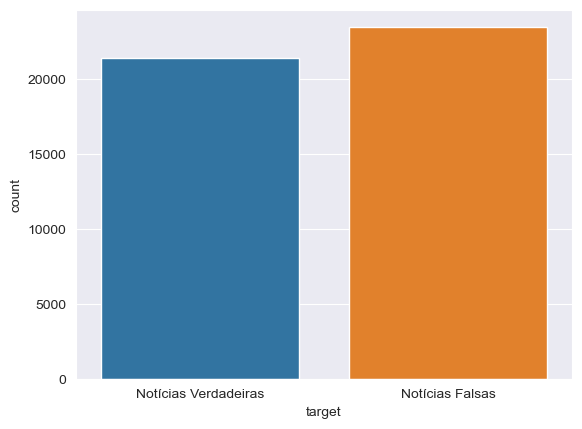

In [19]:
sub_tf_df = copy.deepcopy(df['target'])
sub_tf_df.replace({0:'Notícias Falsas',1:'Notícias Verdadeiras'},inplace=True)
sns.countplot(x=sub_tf_df)

plt.show()

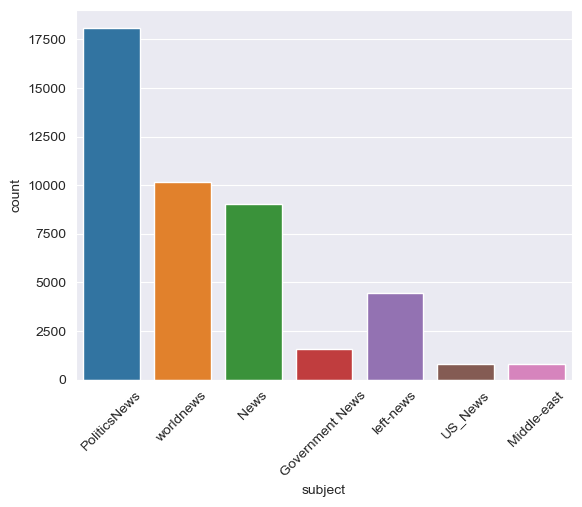

In [20]:
sub_tf_df = copy.deepcopy(df['subject'])
sns.countplot(x=sub_tf_df)

plt.xticks(rotation = 45)
plt.show()

### Estudo da predição da natureza da notícia apenas com o título

In [21]:
df['clean_title'] = df['title'].apply(preprocess)
df['clean_title']

0        [budget, fight, looms, republicans, flip, fisc...
1        [military, accept, transgender, recruits, mond...
2         [senior, republican, senator, let, mueller, job]
3        [fbi, russia, probe, helped, australian, diplo...
4        [trump, wants, postal, service, charge, amazon...
5        [white, house, congress, prepare, talks, spend...
6        [trump, says, russia, probe, fair, timeline, u...
7        [factbox, trump, twitter, dec, approval, ratin...
8                   [trump, twitter, dec, global, warming]
9        [alabama, official, certify, senator, elect, j...
10       [jones, certified, senate, winner, despite, mo...
11       [new, york, governor, questions, federal, tax,...
12       [factbox, trump, twitter, dec, vanity, fair, h...
13               [trump, twitter, dec, trump, iraq, syria]
14       [man, says, delivered, manure, mnuchin, protes...
15       [virginia, officials, postpone, lottery, drawi...
16       [lawmakers, question, businessman, trump, towe.

In [22]:
df['clean_joined_title']=df['clean_title'].apply(lambda x:" ".join(x))
df['clean_joined_title']

0        budget fight looms republicans flip fiscal script
1        military accept transgender recruits monday pe...
2                senior republican senator let mueller job
3        fbi russia probe helped australian diplomat ti...
4        trump wants postal service charge amazon shipm...
5        white house congress prepare talks spending im...
6        trump says russia probe fair timeline unclear nyt
7         factbox trump twitter dec approval rating amazon
8                         trump twitter dec global warming
9        alabama official certify senator elect jones t...
10       jones certified senate winner despite moore ch...
11        new york governor questions federal tax overhaul
12       factbox trump twitter dec vanity fair hillary ...
13                      trump twitter dec trump iraq syria
14       man says delivered manure mnuchin protest new ...
15       virginia officials postpone lottery drawing de...
16       lawmakers question businessman trump tower mee.

O numero maximo de palavras por título é = 34


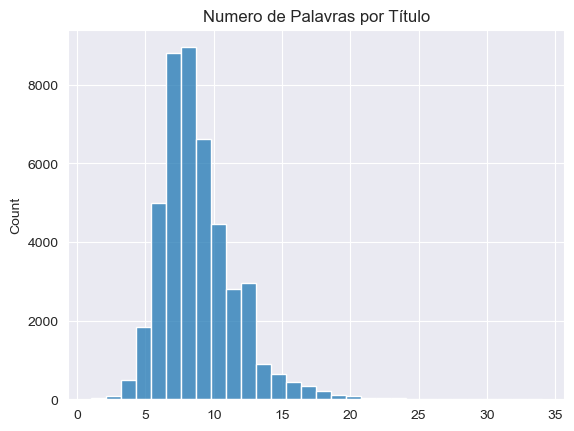

In [23]:
maxlen = -1
for title in df.clean_joined_title:
    tokens = nltk.word_tokenize(title)
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print("O numero maximo de palavras por título é =", maxlen)
sns.histplot(x = [len(nltk.word_tokenize(x)) for x in df.clean_joined_title], bins = 30)
plt.title('Numero de Palavras por Título')
plt.show()

### Realizando previsões na coluna target usando K-ésimo Vizinho mais Próximo

In [24]:
X_train, X_test, y_train, y_test = train_test_split(df.clean_joined_title, df.target, test_size = 0.2,random_state=2)
vec_train = CountVectorizer().fit(X_train)
X_vec_train = vec_train.transform(X_train)
X_vec_test = vec_train.transform(X_test)

In [25]:
from sklearn.neighbors import KNeighborsClassifier

model_knn = KNeighborsClassifier()

model_knn.fit(X_vec_train, y_train)

predicted_value = model_knn.predict(X_vec_test)
accuracy_value = accuracy_score(y_test, predicted_value)
print('Acurácia por KNN :' + str(accuracy_value))

Acurácia por KNN :0.762307863666741


In [30]:
# Calculando a acurácia do modelo com valores diferentes de k
mean_acc = np.zeros(20)
for i in range(1,21):
    #Train Model e Predição  
    knn = KNeighborsClassifier(n_neighbors = i).fit(X_vec_train,y_train)
    yhat= knn.predict(X_vec_test)
    mean_acc[i-1] = accuracy_score(y_test, yhat)

mean_acc

array([0.79137893, 0.73914012, 0.77756739, 0.74749387, 0.76230786,
       0.73869459, 0.74805079, 0.72844732, 0.7345734 , 0.71697483,
       0.72644241, 0.71185119, 0.71953665, 0.70839831, 0.71196258,
       0.70149254, 0.70461127, 0.69748274, 0.70394297, 0.69458677])

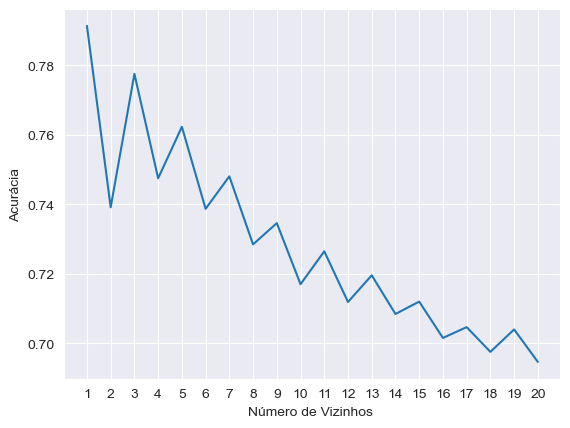

In [31]:
#Plotando evolução do numero de vizinhos com a acurácia
loc = np.arange(1,21,step=1.0)
plt.plot(range(1,21), mean_acc)
plt.xticks(loc)
plt.xlabel('Número de Vizinhos ')
plt.ylabel('Acurácia')
plt.show()

In [32]:
from sklearn.neighbors import KNeighborsClassifier

model_knn = KNeighborsClassifier(n_neighbors=1)

model_knn.fit(X_vec_train, y_train)

predicted_value = model_knn.predict(X_vec_test)
accuracy_value = accuracy_score(y_test, predicted_value)
print('Acurácia de KNN com apenas 1 vizinho é :' + str(accuracy_value))

Acurácia de KNN com apenas 1 vizinho é :0.7913789262642014


### Recriando Título e Conteúdo para os testes

In [33]:
df['clean_final'] = df['original'].apply(preprocess)
df['clean_joined_final']=df['clean_final'].apply(lambda x:" ".join(x))

In [35]:
df['clean_joined_final']

0        budget fight looms republicans flip fiscal scr...
1        military accept transgender recruits monday pe...
2        senior republican senator let mueller job wash...
3        fbi russia probe helped australian diplomat ti...
4        trump wants postal service charge amazon shipm...
5        white house congress prepare talks spending im...
6        trump says russia probe fair timeline unclear ...
7        factbox trump twitter dec approval rating amaz...
8        trump twitter dec global warming following sta...
9        alabama official certify senator elect jones t...
10       jones certified senate winner despite moore ch...
11       new york governor questions federal tax overha...
12       factbox trump twitter dec vanity fair hillary ...
13       trump twitter dec trump iraq syria following s...
14       man says delivered manure mnuchin protest new ...
15       virginia officials postpone lottery drawing de...
16       lawmakers question businessman trump tower mee.

In [36]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(df.clean_joined_final, df.target, test_size = 0.2,random_state=2)
vec_train = CountVectorizer().fit(X_train)
X_vec_train = vec_train.transform(X_train)
X_vec_test = vec_train.transform(X_test)

### Algoritmos de Machine Learning

### Usando o classificador KNN

In [67]:
# Calculando a acurácia do modelo com valores diferentes de k
mean_acc = np.zeros(20)
for i in range(1, 21, 2):
    #Train Model e Predição  
    knn = KNeighborsClassifier(n_neighbors = i).fit(X_vec_train,y_train)
    yhat= knn.predict(X_vec_test)
    mean_acc[i-1] = accuracy_score(y_test, yhat)

mean_acc

array([0.84662508, 0.        , 0.81343284, 0.        , 0.8049677 ,
       0.        , 0.79382936, 0.        , 0.78514146, 0.        ,
       0.77912675, 0.        , 0.7741145 , 0.        , 0.77121853,
       0.        , 0.76709735, 0.        , 0.76486968, 0.        ])

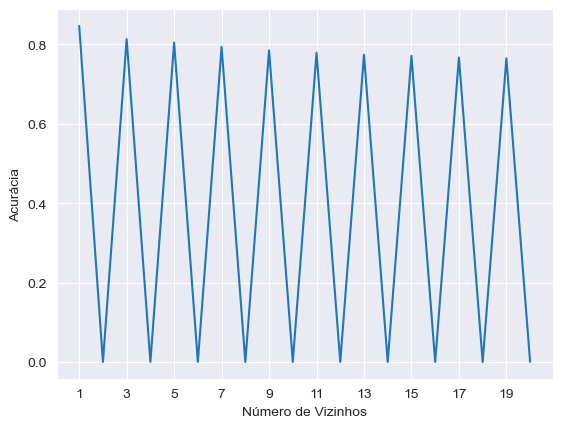

In [38]:
# Plotando evolução do numero de vizinhos com a acurácia
loc = np.arange(1, 21, step = 2.0)
plt.plot(range(1 ,21), mean_acc)
plt.xticks(loc)
plt.xlabel('Número de Vizinhos')
plt.ylabel('Acurácia')
plt.show()

In [78]:

from sklearn.neighbors import KNeighborsClassifier

model_knn = KNeighborsClassifier(n_neighbors=1)

model_knn.fit(X_vec_train, y_train)

y_train_pred = model_knn.predict(X_vec_train)
y_test_pred = model_knn.predict(X_vec_test)

accuracy_value = accuracy_score(y_test, y_test_pred)
print('Acurácia de KNN com apenas 1 vizinho é :' + str(accuracy_value))

scores_dict['Knn'] = {
        'Treino': accuracy_score(y_train,y_train_pred),
        'Teste': accuracy_score(y_test, y_test_pred),
}

Acurácia de KNN com apenas 1 vizinho é :0.8466250835375362


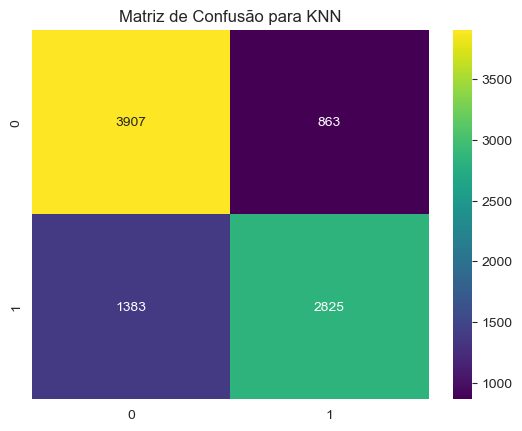

In [79]:
cm = confusion_matrix(list(y_test_pred), predicted_value)
sns.heatmap(cm, annot = True,fmt='g',cmap='viridis')
plt.title("Matriz de Confusão para KNN")
plt.show()

### Usando Random Forest Classifier

In [81]:
from sklearn.ensemble import RandomForestClassifier

#Criando Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Treino de modelo usando sets de treino y_pred=clf.predict(X_test)
clf.fit(X_vec_train,y_train)

y_train_pred = clf.predict(X_vec_train)
y_test_pred = clf.predict(X_vec_test)

accuracy_value = accuracy_score(y_test, y_test_pred)
print('Acurácia de Random Forest Classifier é :' + str(accuracy_value))

scores_dict['Random Forest'] = {
        'Treino': accuracy_score(y_train,y_train_pred),
        'Teste': accuracy_score(y_test, y_test_pred),
}

Acurácia de Random Forest Classifier é :0.9926486968144352


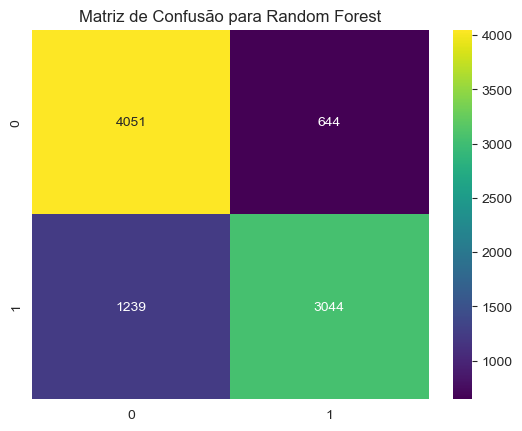

In [82]:
cm = confusion_matrix(list(y_test_pred), predicted_value)
sns.heatmap(cm, annot = True,fmt='g',cmap='viridis')
plt.title("Matriz de Confusão para Random Forest")
plt.show()

### Usando Lógica de Regressão

In [83]:
#Importando modelo de regressão logística
from sklearn.linear_model import LogisticRegression


#Criando classificador SVM
LOG = LogisticRegression()

#Treino de modelo usando sets de modelo
LOG.fit(X_vec_train, y_train)

y_train_pred = LOG.predict(X_vec_train)
y_test_pred = LOG.predict(X_vec_test)

accuracy_value = accuracy_score(y_test, y_test_pred)
print('Acurácia de Classificador Regressão Logística é :' + str(accuracy_value))

scores_dict['Regressão Logística'] = {
        'Treino': accuracy_score(y_train,y_train_pred),
        'Teste': accuracy_score(y_test, y_test_pred),
}

Acurácia de Classificador Regressão Logística é :0.9954332813544219


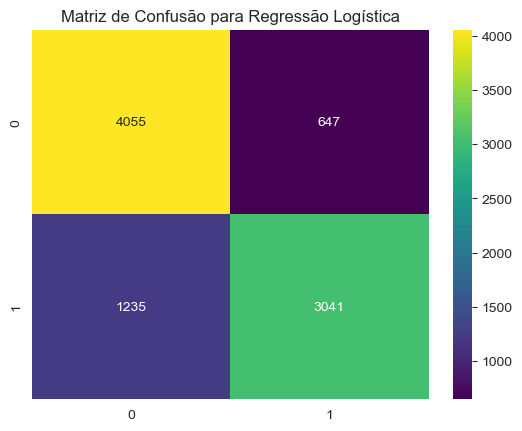

In [84]:
cm = confusion_matrix(list(y_test_pred), predicted_value)
sns.heatmap(cm, annot = True,fmt='g',cmap='viridis')
plt.title("Matriz de Confusão para Regressão Logística")
plt.show()

### Usando XGBoost

In [85]:
#Importando modelo de regressão
import xgboost as xgb


#Criando classificador SVM
XGB = xgb.XGBClassifier()

#Treino de modelo usando sets de modelo
XGB.fit(X_vec_train, y_train)

y_train_pred = XGB.predict(X_vec_train)
y_test_pred = XGB.predict(X_vec_test)

accuracy_value = accuracy_score(y_test, y_test_pred)
print('Acurácia de XGBoost é :' + str(accuracy_value))

scores_dict['XGBoost'] = {
        'Treino': accuracy_score(y_train,y_train_pred),
        'Teste': accuracy_score(y_test, y_test_pred),
}

Acurácia de XGBoost é :0.9978837157496102


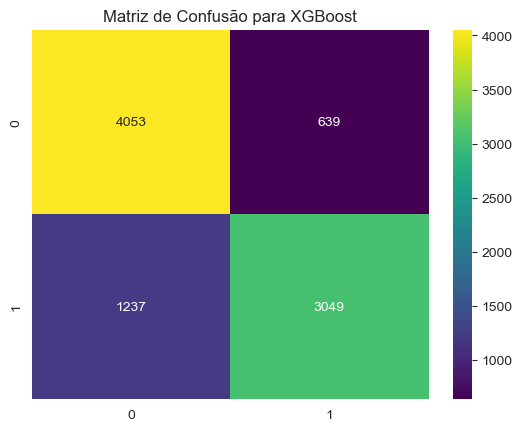

In [86]:
cm = confusion_matrix(list(y_test_pred), predicted_value)
sns.heatmap(cm, annot = True,fmt='g',cmap='viridis')
plt.title("Matriz de Confusão para XGBoost")
plt.show()

### Validação Cruzada com XGBoost

In [60]:
from xgboost import cv
import xgboost as xgb

vec_train = CountVectorizer().fit(df.clean_joined_final)
X_vec_ = vec_train.transform(df.clean_joined_final)

# Definindo data_dmatrix
data_dmatrix = xgb.DMatrix(data=X_vec_ ,label=df.target)

params = {"objective":"binary:logistic",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}

xgb_cv = cv(dtrain=data_dmatrix, params=params, nfold=3,
                    num_boost_round=50, early_stopping_rounds=10, metrics="auc", as_pandas=True, seed=123)

In [61]:
xgb_cv.head()

,train-auc-mean,train-auc-std,test-auc-mean,test-auc-std
0,0.888329,0.000692,0.887519,0.001959
1,0.957187,0.027905,0.956958,0.028581
2,0.972945,0.017134,0.971994,0.018024
3,0.987821,0.011757,0.986667,0.013735
4,0.988238,0.009738,0.987471,0.011446


### Comparação de Resultados

<AxesSubplot:>

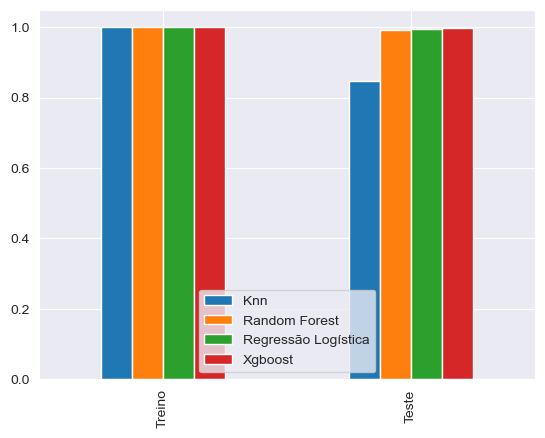

In [47]:
scores_df = pd.DataFrame(scores_dict)

scores_df.plot(kind='bar')

### Wordcloud

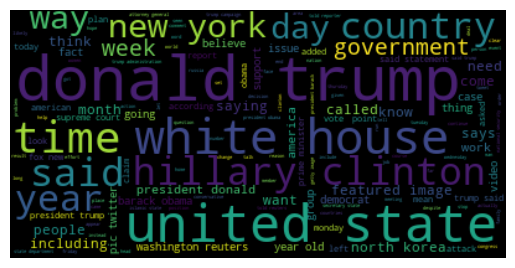

In [68]:
#Wordcloud geral
import matplotlib.pyplot as plt
from wordcloud import WordCloud

text_full = df['clean_joined_final']
text_full = " ".join(text_full)

wordcloud = WordCloud().generate(text_full)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Números e palavras de 2015

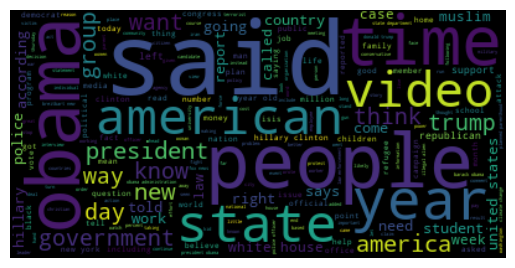

In [69]:
#Wordcloud geral de 2015
year_2015_filter = '2015'
df_year_2015 = df[df['year'] == year_2015_filter]

text_2015 = df_year_2015['clean_joined_final'].str.cat(sep=' ')
wordcloud = WordCloud().generate(text_2015)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

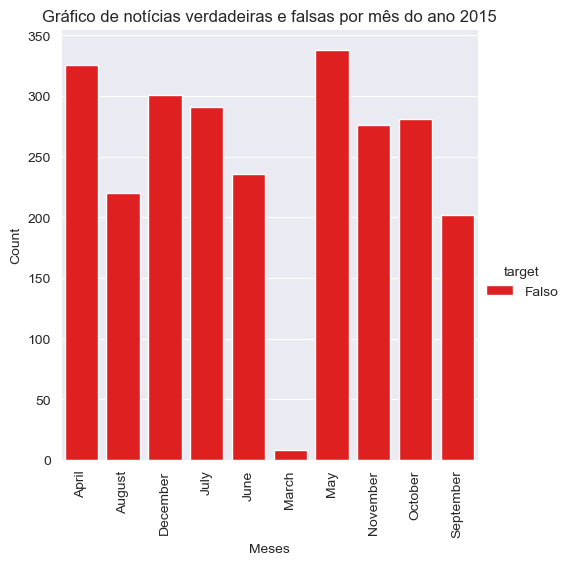

In [70]:
#Agrupando por mês e target agregando count em 2015
df_year_2015['target'] = df_year_2015['target'].map({0: 'Falso', 1: 'Verdadeiro'})
grouped = df_year_2015.groupby(['month', 'target'])['target'].count().reset_index(name='count')

sns.catplot(x="month", y="count", hue="target", kind="bar", data=grouped, palette=["red", "blue"])

plt.xlabel("Meses")
plt.ylabel("Count")
plt.title("Gráfico de notícias verdadeiras e falsas por mês do ano 2015")
plt.xticks(rotation = 90)
plt.show()

### Números e palavras de 2016

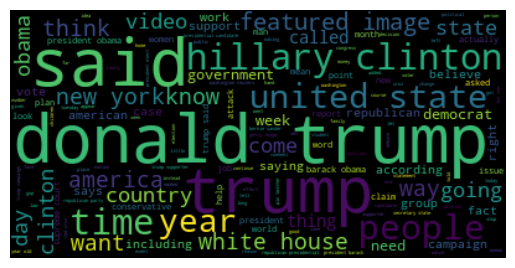

In [71]:
#Wordcloud geral de 2016
year_2016_filter = '2016'
df_year_2016 = df[df['year'] == year_2016_filter]

text_2016 = df_year_2016['clean_joined_final'].str.cat(sep=' ')
wordcloud = WordCloud().generate(text_2016)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

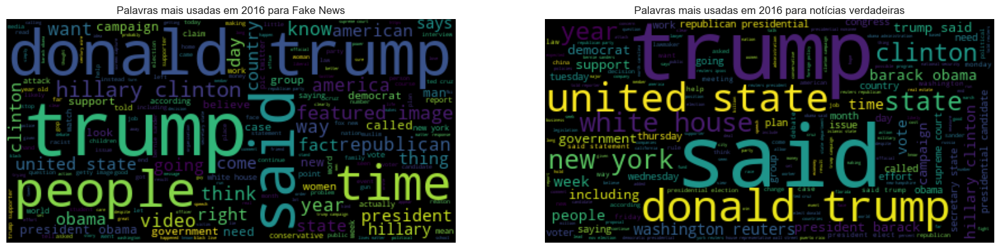

In [72]:
#Wordcloud segregado por target de 2016
# Filtro para valor 0 da coluna target
df_target_0_2016 = df_year_2016[df_year_2016['target'] == 0]
text_0_2016 = df_target_0_2016['clean_joined_final'].str.cat(sep=' ')
wordcloud_0 = WordCloud().generate(text_0_2016)

# Filtro para valor 1 da coluna target
df_target_1_2016 = df_year_2016[df_year_2016['target'] == 1]
text_1_2016 = df_target_1_2016['clean_joined_final'].str.cat(sep=' ')
wordcloud_1 = WordCloud().generate(text_1_2016)

# Plotando as duas wordclouds lado a lado
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(wordcloud_0, interpolation='bilinear')
ax[0].axis("off")
ax[0].set_title("Palavras mais usadas em 2016 para Fake News")

ax[1].imshow(wordcloud_1, interpolation='bilinear')
ax[1].axis("off")
ax[1].set_title("Palavras mais usadas em 2016 para notícias verdadeiras")

plt.show()

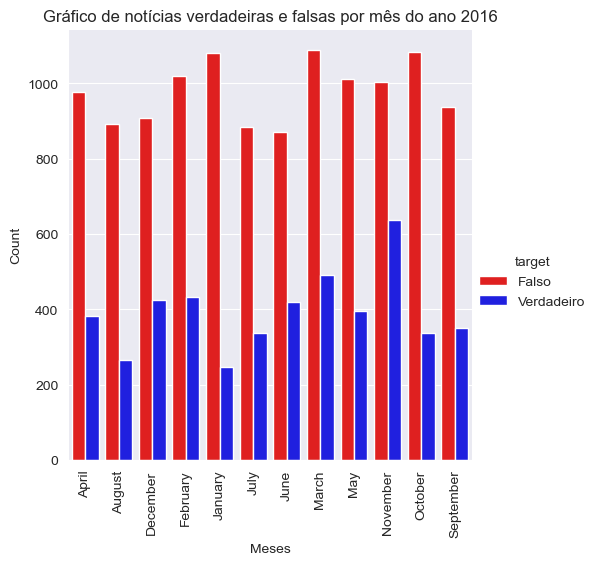

In [73]:
#Agrupando por mês e target agregando count em 2016
df_year_2016['target'] = df_year_2016['target'].map({0: 'Falso', 1: 'Verdadeiro'})
grouped = df_year_2016.groupby(['month', 'target'])['target'].count().reset_index(name='count')

sns.catplot(x="month", y="count", hue="target", kind="bar", data=grouped, palette=["red", "blue"])


plt.xlabel("Meses")
plt.ylabel("Count")
plt.title("Gráfico de notícias verdadeiras e falsas por mês do ano 2016")
plt.xticks(rotation = 90)
plt.show()

### Números e palavras de 2017

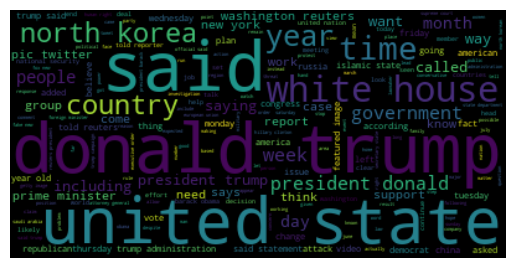

In [75]:
#Wordcloud geral de 2017
year_2017_filter = '2017'
df_year_2017 = df[df['year'] == year_2017_filter]

text_2017 = df_year_2017['clean_joined_final'].str.cat(sep=' ')
wordcloud = WordCloud().generate(text_2017)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

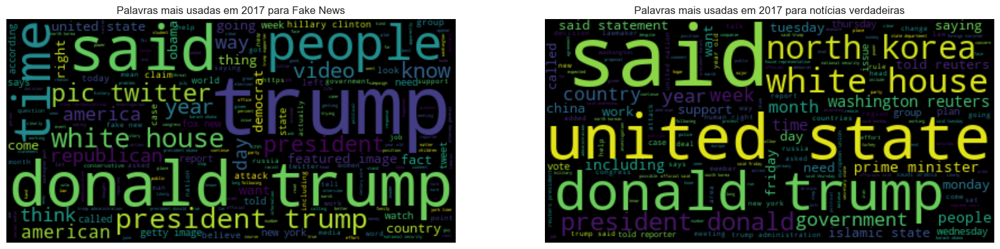

In [76]:
#Wordcloud segregado por target de 2017
# Filtro para valor 0 da coluna target
df_target_0_2017 = df_year_2017[df_year_2017['target'] == 0]
text_0_2017 = df_target_0_2017['clean_joined_final'].str.cat(sep=' ')
wordcloud_0 = WordCloud().generate(text_0_2017)

# Filtro para valor 1 da coluna target
df_target_1_2017 = df_year_2017[df_year_2017['target'] == 1]
text_1_2017 = df_target_1_2017['clean_joined_final'].str.cat(sep=' ')
wordcloud_1 = WordCloud().generate(text_1_2017)

# Plotando as duas wordclouds lado a lado
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(wordcloud_0, interpolation='bilinear')
ax[0].axis("off")
ax[0].set_title("Palavras mais usadas em 2017 para Fake News")

ax[1].imshow(wordcloud_1, interpolation='bilinear')
ax[1].axis("off")
ax[1].set_title("Palavras mais usadas em 2017 para notícias verdadeiras")

plt.show()

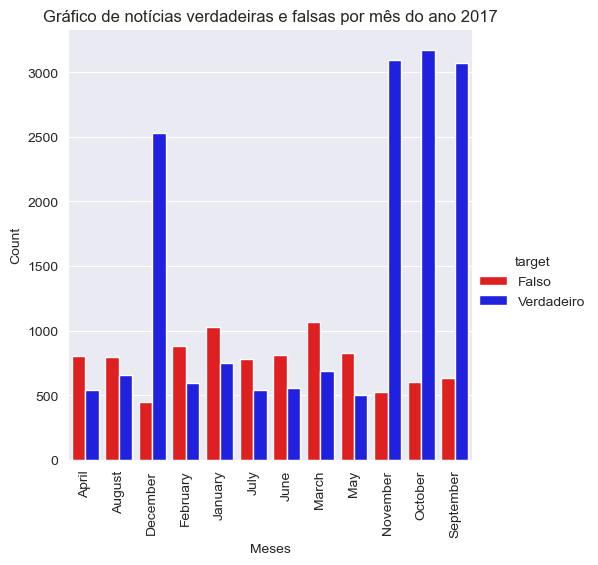

In [77]:
#Agrupando por mês e target agregando count em 2017
df_year_2017['target'] = df_year_2017['target'].map({0: 'Falso', 1: 'Verdadeiro'})
grouped = df_year_2017.groupby(['month', 'target'])['target'].count().reset_index(name='count')

sns.catplot(x="month", y="count", hue="target", kind="bar", data=grouped, palette=["red", "blue"])

plt.xlabel("Meses")
plt.ylabel("Count")
plt.title("Gráfico de notícias verdadeiras e falsas por mês do ano 2017")
plt.xticks(rotation = 90)
plt.show()

### Números e palavras de 2018

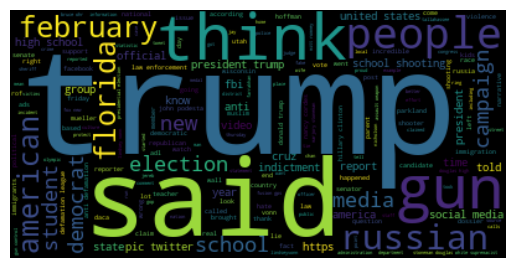

In [87]:
#Wordcloud geral de 2018
year_2018_filter = '2018'
df_year_2018 = df[df['year'] == year_2018_filter]

text_2018 = df_year_2018['clean_joined_final'].str.cat(sep=' ')
wordcloud = WordCloud().generate(text_2018)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

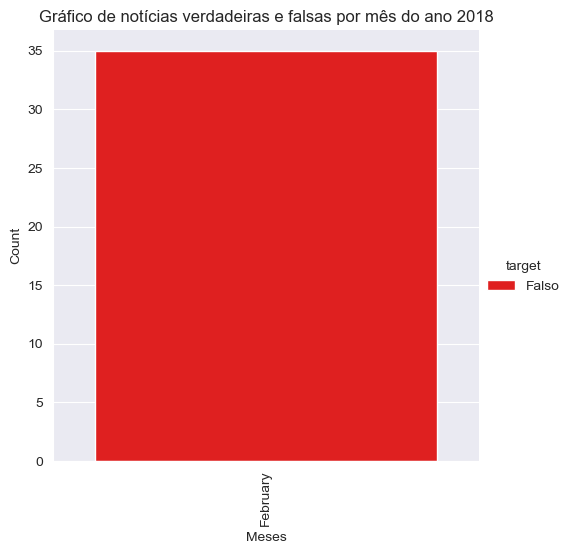

In [88]:
#Agrupando por mês e target agregando count em 2018
df_year_2018['target'] = df_year_2018['target'].map({0: 'Falso', 1: 'Verdadeiro'})
grouped = df_year_2018.groupby(['month', 'target'])['target'].count().reset_index(name='count')

sns.catplot(x="month", y="count", hue="target", kind="bar", data=grouped, palette=["red", "blue"])

plt.xlabel("Meses")
plt.ylabel("Count")
plt.title("Gráfico de notícias verdadeiras e falsas por mês do ano 2018")
plt.xticks(rotation = 90)
plt.show()